# Week 3 Assignment

Author: Frida Nicole Barragan
###### In this project I used the geopandas fuction to create a choropleth map of all the median household incomes distributed by zip code in the LA county. I also did simple stats on the income data and created a bar plot to showcase the median household incomes. Then, I used the coordinates in the data set of all the medical clinics to plot different maps. I filtered the data by certified and licensed clinics, licensed only clinics and certified only clinics. Then, I created plots for each filtered category in different colors so created a visual contrast between the three different sets of data.

### Median Household Income in LA County

In [75]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
from geopandas import GeoDataFrame

In [2]:
income = gpd.read_file('income.geojson')

In [3]:
income.shape

(303, 5)

In [4]:
income.head()

,geoid,name,B19013001,"B19013001, Error",geometry
0,05000US06037,"Los Angeles County, CA",68044.0,347.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,86000US90001,90001,43360.0,2437.0,"MULTIPOLYGON (((-118.26519 33.98923, -118.2620..."
2,86000US90002,90002,37285.0,1920.0,"MULTIPOLYGON (((-118.26516 33.94643, -118.2651..."
3,86000US90003,90003,40598.0,1743.0,"MULTIPOLYGON (((-118.28320 33.98914, -118.2826..."
4,86000US90004,90004,49675.0,1784.0,"MULTIPOLYGON (((-118.33858 34.08346, -118.3381..."


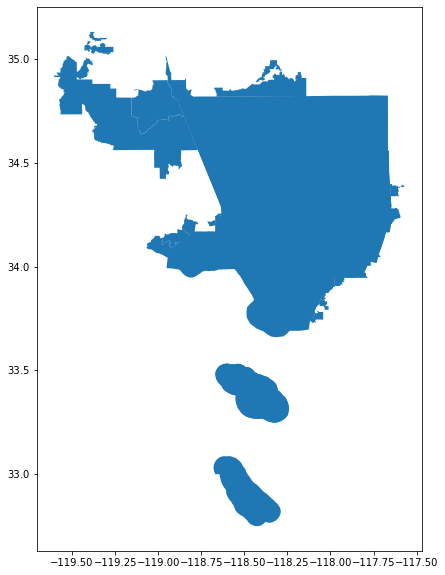

In [5]:
income.plot(figsize=(10,10))

In [6]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [7]:
income.sample()

,geoid,name,B19013001,"B19013001, Error",geometry
127,86000US90630,90630,93183.0,3130.0,"MULTIPOLYGON (((-118.06488 33.82422, -118.0648..."


In [8]:
income.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             303 non-null    object  
 1   name              303 non-null    object  
 2   B19013001         288 non-null    float64 
 3   B19013001, Error  288 non-null    float64 
 4   geometry          303 non-null    geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 12.0+ KB


In [9]:
income.geoid.head()

0    05000US06037
1    86000US90001
2    86000US90002
3    86000US90003
4    86000US90004
Name: geoid, dtype: object

In [10]:
income.head()

,geoid,name,B19013001,"B19013001, Error",geometry
0,05000US06037,"Los Angeles County, CA",68044.0,347.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,86000US90001,90001,43360.0,2437.0,"MULTIPOLYGON (((-118.26519 33.98923, -118.2620..."
2,86000US90002,90002,37285.0,1920.0,"MULTIPOLYGON (((-118.26516 33.94643, -118.2651..."
3,86000US90003,90003,40598.0,1743.0,"MULTIPOLYGON (((-118.28320 33.98914, -118.2826..."
4,86000US90004,90004,49675.0,1784.0,"MULTIPOLYGON (((-118.33858 34.08346, -118.3381..."


In [11]:
income = income.drop([0])

In [12]:
income.head()

,geoid,name,B19013001,"B19013001, Error",geometry
1,86000US90001,90001,43360.0,2437.0,"MULTIPOLYGON (((-118.26519 33.98923, -118.2620..."
2,86000US90002,90002,37285.0,1920.0,"MULTIPOLYGON (((-118.26516 33.94643, -118.2651..."
3,86000US90003,90003,40598.0,1743.0,"MULTIPOLYGON (((-118.28320 33.98914, -118.2826..."
4,86000US90004,90004,49675.0,1784.0,"MULTIPOLYGON (((-118.33858 34.08346, -118.3381..."
5,86000US90005,90005,38491.0,2241.0,"MULTIPOLYGON (((-118.29291 34.06360, -118.2923..."


In [13]:
list(income)

['geoid', 'name', 'B19013001', 'B19013001, Error', 'geometry']

In [14]:
columns_to_keep = ['geoid',
 'name',
 'B19013001',
 'geometry']

In [15]:
income = income[columns_to_keep]

In [16]:
income.head()

,geoid,name,B19013001,geometry
1,86000US90001,90001,43360.0,"MULTIPOLYGON (((-118.26519 33.98923, -118.2620..."
2,86000US90002,90002,37285.0,"MULTIPOLYGON (((-118.26516 33.94643, -118.2651..."
3,86000US90003,90003,40598.0,"MULTIPOLYGON (((-118.28320 33.98914, -118.2826..."
4,86000US90004,90004,49675.0,"MULTIPOLYGON (((-118.33858 34.08346, -118.3381..."
5,86000US90005,90005,38491.0,"MULTIPOLYGON (((-118.29291 34.06360, -118.2923..."


In [17]:
income.columns = ['geoid',
 'name',
 'Median Household Income',
 'geometry']

In [18]:
income.head()

,geoid,name,Median Household Income,geometry
1,86000US90001,90001,43360.0,"MULTIPOLYGON (((-118.26519 33.98923, -118.2620..."
2,86000US90002,90002,37285.0,"MULTIPOLYGON (((-118.26516 33.94643, -118.2651..."
3,86000US90003,90003,40598.0,"MULTIPOLYGON (((-118.28320 33.98914, -118.2826..."
4,86000US90004,90004,49675.0,"MULTIPOLYGON (((-118.33858 34.08346, -118.3381..."
5,86000US90005,90005,38491.0,"MULTIPOLYGON (((-118.29291 34.06360, -118.2923..."


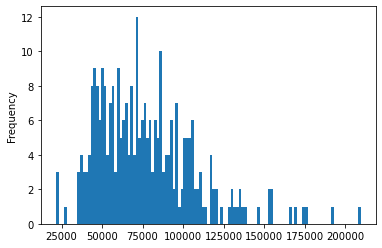

In [74]:
income['Median Household Income'].plot.hist(bins=115)

In [20]:
income_gdt = income.sort_values(by='Median Household Income',ascending = False)

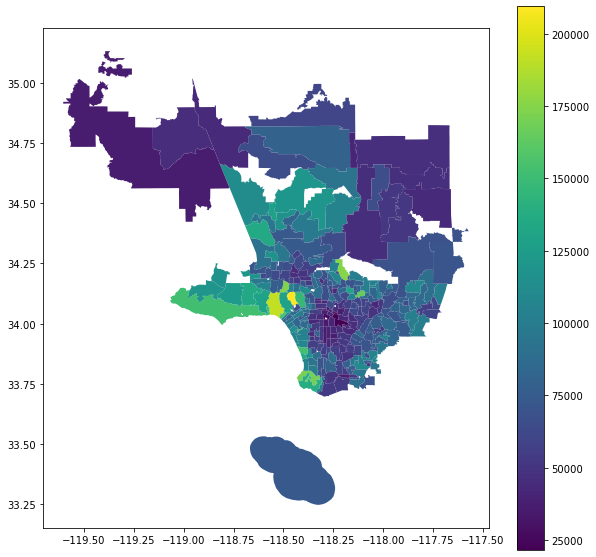

In [68]:
income_gdt.head(303).plot(figsize=(10,10),column='Median Household Income',legend=True)

Map of the Median household Distribution in LA county

### Licensed and Certified healthcare clinics in LA County

In [22]:
clc = gpd.read_file('healthcare.csv')

In [23]:
type(clc)

geopandas.geodataframe.GeoDataFrame

In [24]:
clc[['LICENSED_CERTIFIED', 'LATITUDE', 'LONGITUDE', 'LOCATION', 'geometry']]

,LICENSED_CERTIFIED,LATITUDE,LONGITUDE,LOCATION,geometry
0,LICENSED AND CERTIFIED,38.256552,-122.628024,"(-122.628024,38.256552)",None
1,LICENSED AND CERTIFIED,38.438712,-122.7059775,"(-122.7059775,38.438712)",None
2,LICENSED AND CERTIFIED,41.768559,-124.200918,"(-124.200918,41.768559)",None
3,LICENSED AND CERTIFIED,38.22156,-122.646834,"(-122.646834,38.22156)",None
4,LICENSED AND CERTIFIED,40.781097,-124.13547,"(-124.13547,40.781097)",None
5,LICENSED AND CERTIFIED,38.38950729,-122.8154125,"(-122.8154125,38.389507287)",None
6,LICENSED AND CERTIFIED,38.228193,-122.6447955,"(-122.6447955,38.228193)",None
7,LICENSED AND CERTIFIED,38.61771583,-122.8757421,"(-122.8757421,38.617715831)",None
8,LICENSED AND CERTIFIED,38.44098,-122.665284,"(-122.665284,38.44098)",None
9,LICENSED AND CERTIFIED,38.289087,-122.4610785,"(-122.4610785,38.289087)",None


In [25]:
need = ['LICENSED_CERTIFIED','COUNTY_NAME', 'LATITUDE', 'LONGITUDE', 'geometry']
clc[need]

,LICENSED_CERTIFIED,COUNTY_NAME,LATITUDE,LONGITUDE,geometry
0,LICENSED AND CERTIFIED,SONOMA,38.256552,-122.628024,None
1,LICENSED AND CERTIFIED,SONOMA,38.438712,-122.7059775,None
2,LICENSED AND CERTIFIED,DEL NORTE,41.768559,-124.200918,None
3,LICENSED AND CERTIFIED,SONOMA,38.22156,-122.646834,None
4,LICENSED AND CERTIFIED,HUMBOLDT,40.781097,-124.13547,None
5,LICENSED AND CERTIFIED,SONOMA,38.38950729,-122.8154125,None
6,LICENSED AND CERTIFIED,SONOMA,38.228193,-122.6447955,None
7,LICENSED AND CERTIFIED,SONOMA,38.61771583,-122.8757421,None
8,LICENSED AND CERTIFIED,SONOMA,38.44098,-122.665284,None
9,LICENSED AND CERTIFIED,SONOMA,38.289087,-122.4610785,None


In [26]:
clc_trimmed = clc[need].copy()

In [27]:
gdf = gpd.GeoDataFrame(
    clc_trimmed, geometry=gpd.points_from_xy(clc_trimmed.LONGITUDE, clc_trimmed.LATITUDE))
gdf.head()

,LICENSED_CERTIFIED,COUNTY_NAME,LATITUDE,LONGITUDE,geometry
0,LICENSED AND CERTIFIED,SONOMA,38.256552,-122.628024,POINT (-122.62802 38.25655)
1,LICENSED AND CERTIFIED,SONOMA,38.438712,-122.7059775,POINT (-122.70598 38.43871)
2,LICENSED AND CERTIFIED,DEL NORTE,41.768559,-124.200918,POINT (-124.20092 41.76856)
3,LICENSED AND CERTIFIED,SONOMA,38.22156,-122.646834,POINT (-122.64683 38.22156)
4,LICENSED AND CERTIFIED,HUMBOLDT,40.781097,-124.13547,POINT (-124.13547 40.78110)


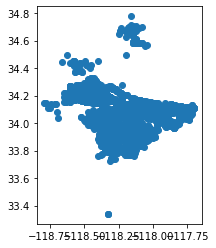

In [28]:
lacountyclc= clc_trimmed[clc_trimmed.COUNTY_NAME == 'LOS ANGELES']
lacountyclc.plot()

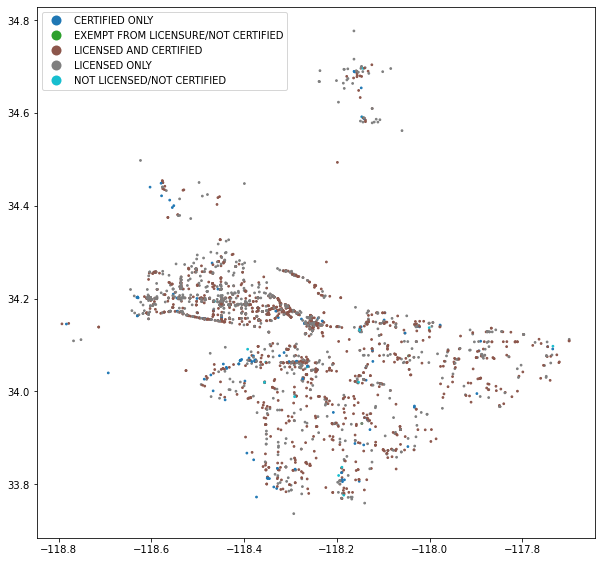

In [64]:
lacountyclc.head(2900).plot(figsize=(10,10),column='LICENSED_CERTIFIED',legend=True, markersize= 3)

#### Licensed and Certified Only 

In [29]:
clc_lic_cert= lacountyclc[lacountyclc.LICENSED_CERTIFIED == 'LICENSED AND CERTIFIED']

In [30]:
lcmap = gpd.GeoDataFrame(
    clc_lic_cert, geometry=gpd.points_from_xy(clc_lic_cert.LONGITUDE, clc_lic_cert.LATITUDE))
lcmap.head()

,LICENSED_CERTIFIED,COUNTY_NAME,LATITUDE,LONGITUDE,geometry
876,LICENSED AND CERTIFIED,LOS ANGELES,34.08651,-118.1233125,POINT (-118.12331 34.08651)
901,LICENSED AND CERTIFIED,LOS ANGELES,33.830325,-118.2920175,POINT (-118.29202 33.83033)
902,LICENSED AND CERTIFIED,LOS ANGELES,33.9291,-118.1579985,POINT (-118.15800 33.92910)
908,LICENSED AND CERTIFIED,LOS ANGELES,33.924186,-118.244151,POINT (-118.24415 33.92419)
910,LICENSED AND CERTIFIED,LOS ANGELES,34.326981,-118.4517,POINT (-118.45170 34.32698)


In [31]:
lcmap.shape

(2900, 5)

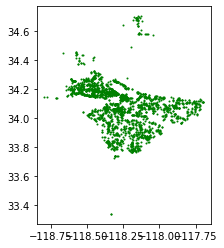

In [32]:
lcmap.plot(color = 'green', markersize = 1)


In [33]:
lcmap['LICENSED_CERTIFIED']

876      LICENSED AND CERTIFIED
901      LICENSED AND CERTIFIED
902      LICENSED AND CERTIFIED
908      LICENSED AND CERTIFIED
910      LICENSED AND CERTIFIED
912      LICENSED AND CERTIFIED
1005     LICENSED AND CERTIFIED
1009     LICENSED AND CERTIFIED
1010     LICENSED AND CERTIFIED
1025     LICENSED AND CERTIFIED
1026     LICENSED AND CERTIFIED
1031     LICENSED AND CERTIFIED
1056     LICENSED AND CERTIFIED
1065     LICENSED AND CERTIFIED
1244     LICENSED AND CERTIFIED
1370     LICENSED AND CERTIFIED
3137     LICENSED AND CERTIFIED
3138     LICENSED AND CERTIFIED
3893     LICENSED AND CERTIFIED
4109     LICENSED AND CERTIFIED
4115     LICENSED AND CERTIFIED
4117     LICENSED AND CERTIFIED
4121     LICENSED AND CERTIFIED
4128     LICENSED AND CERTIFIED
4136     LICENSED AND CERTIFIED
4137     LICENSED AND CERTIFIED
4156     LICENSED AND CERTIFIED
4175     LICENSED AND CERTIFIED
4180     LICENSED AND CERTIFIED
4201     LICENSED AND CERTIFIED
4220     LICENSED AND CERTIFIED
4230    

In [34]:
lc_count = lcmap['LICENSED_CERTIFIED'].value_counts()
lc_count

LICENSED AND CERTIFIED    2900
Name: LICENSED_CERTIFIED, dtype: int64

#### Licensed Only

In [54]:
clc_lic= lacountyclc[lacountyclc.LICENSED_CERTIFIED == 'LICENSED ONLY']

In [55]:
lmap = gpd.GeoDataFrame(
    clc_lic, geometry=gpd.points_from_xy(clc_lic.LONGITUDE, clc_lic.LATITUDE))
lmap.head()

,LICENSED_CERTIFIED,COUNTY_NAME,LATITUDE,LONGITUDE,geometry
1202,LICENSED ONLY,LOS ANGELES,33.9273,-118.197828,POINT (-118.19783 33.92730)
1203,LICENSED ONLY,LOS ANGELES,33.970851,-118.196523,POINT (-118.19652 33.97085)
1204,LICENSED ONLY,LOS ANGELES,34.065648,-118.2676635,POINT (-118.26766 34.06565)
1205,LICENSED ONLY,LOS ANGELES,34.033572,-118.148832,POINT (-118.14883 34.03357)
1206,LICENSED ONLY,LOS ANGELES,34.059132,-118.2808125,POINT (-118.28081 34.05913)


In [56]:
lmap.shape

(1417, 5)

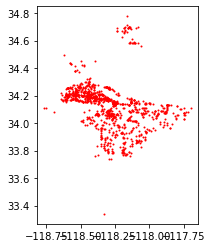

In [57]:
lmap.plot(color = 'red', markersize = 1)

#### Certified Only

In [58]:
clc_cert= lacountyclc[lacountyclc.LICENSED_CERTIFIED == 'CERTIFIED ONLY']

In [59]:
certmap = gpd.GeoDataFrame(
    clc_cert, geometry=gpd.points_from_xy(clc_cert.LONGITUDE, clc_cert.LATITUDE))
certmap.head()

,LICENSED_CERTIFIED,COUNTY_NAME,LATITUDE,LONGITUDE,geometry
4200,CERTIFIED ONLY,LOS ANGELES,34.412346,-118.560519,POINT (-118.56052 34.41235)
4217,CERTIFIED ONLY,LOS ANGELES,34.689942,-118.163097,POINT (-118.16310 34.68994)
4218,CERTIFIED ONLY,LOS ANGELES,34.14299137,-117.9776059,POINT (-117.97761 34.14299)
4219,CERTIFIED ONLY,LOS ANGELES,34.09630029,-117.7456368,POINT (-117.74564 34.09630)
4232,CERTIFIED ONLY,LOS ANGELES,34.157232,-118.4885595,POINT (-118.48856 34.15723)


In [60]:
certmap.shape

(247, 5)

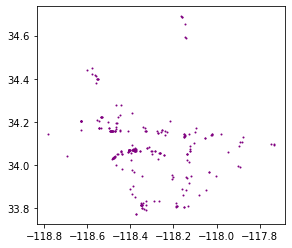

In [61]:
certmap.plot(color = 'purple', markersize = 1)